## Spot Calling with BigFISH
Before running: Go to the terminal and make sure the `bigfish` conda environment is activated: \
`$ mamba activate bigfish` (mush faster) \
or \
`$ conda activate bigfish`

In [29]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from PIL import Image
import io
import base64
# Image maniuplation
from skimage.segmentation import expand_labels
# BigFISH modules
import bigfish.stack as stack
import bigfish.multistack as multistack
import bigfish.detection as detection
import bigfish.plot as plot

In [16]:
### Function to apply the cell mask to the called spots
def apply_mask(spots, mask):
    """
    Filter spots (z, y, x) to keep only those that fall inside mask regions
    Parameters:
        spots - array with shape (z,y,x) or (y,x); spots detected from image
        mask - array with shape equal to that of image; masks cells from background
    """
    # Extract coordinates
    z = spots[:, 0]
    y = spots[:, 1].astype(int)
    x = spots[:, 2].astype(int)

    # Only keep spots within the image bounds
    in_bounds = ((y >= 0) & (y < mask.shape[0]) & (x >= 0) & (x < mask.shape[1]))

    # Filter 
    z = z[in_bounds]
    y = y[in_bounds]
    x = x[in_bounds]

    # Get mask label for each spot
    labels = np.array([mask[yy, xx] for yy, xx in zip(y, x)])
    print(labels)
    # Filter for spots inside a labeled cell (mask > 0)
    keep = labels > 0
    
    # Return filtered array
    return np.stack([z[keep], y[keep], x[keep]], axis=1)

### Define parameters & read images

In [17]:
##### Define some parameters
img_dir = "/mnt/data2/noah/fish_image/images_zStack/" # Directory of images
mask_dir = "/mnt/data2/noah/fish_image/images_mask/" # Directory of binary mask images
fovs = [f"{i:02}" for i in range(1, 43)]  # FOV keys, 1 through 42 for our data
channels = ["DAPI", "Cy3", "A647"] # Channels used, 3 in our data

##### Make recipe for image I/O (for now just use FOV 01 as an example)
recipe = {
    "fov": "01",
    "c": channels,
    "opt": "Location",
    "ext": "tif",
    "pattern": "opt_fov_c.ext"}

In [18]:
##### Load in the image as a stack
img = multistack.build_stack(recipe, input_folder=img_dir) # Shape = (round, channel, z, y, x)
print(f"Image shape: {img.shape}")

Image shape: (1, 3, 30, 1843, 1843)


### Image preprocessing

In [19]:
##### Rescale pixel intensity
img_rescaled = np.stack([
    stack.rescale(img[0, c]) for c in range(img.shape[1])
], axis=0) 

##### Cast images to float
img_rescaled_64bitFloat = np.stack([
    stack.cast_img_float64(img[0, c]) for c in range(img.shape[1])
], axis=0)  # (3, Z, Y, X)

In [20]:
img_rescaled_64bitFloat.shape

(3, 30, 1843, 1843)

In [21]:
##### We only have 1 run, so remove the redundant run dimension
if img.ndim == 5 and img.shape[0] == 1:
    img = np.squeeze(img, axis=0)

### Spot detection

In [22]:
dot_channel = img[channels.index("Cy3")]

# Load mask
mask_path = os.path.join(mask_dir, f"Mask_01_DAPI.tif")
mask = stack.read_image(mask_path)

# Expand mask using a skimage function
mask = expand_labels(mask, distance=10)
print(mask.shape)

(1843, 1843)


In [36]:
##### Initial spot detection
spots, thresh = detection.detect_spots(dot_channel,
    voxel_size=(0.3, 0.108, 0.108),   # Microns per voxel
    spot_radius=(0.5, 0.5, 0.5),    # Micron radii of spots
                                        return_threshold=True)

print(spots.shape)
print(f"Detected {spots.shape[0]} spots before applying cell mask.")

(7942, 3)
Detected 7942 spots before applying cell mask.


In [37]:
### Dense Spot Decomposition
spots_post_decomposition, dense_regions, reference_spot = detection.decompose_dense(
        image=dot_channel, 
        spots=spots, 
    voxel_size=(0.3, 0.108, 0.108),   # Microns per voxel
    spot_radius=(0.5, 0.15, 0.15),    # Micron radii of spots
        alpha=1,                     # alpha impacts the number of spots per candidate region
        beta=1,                      # beta impacts the number of candidate regions to decompose
        gamma=10)                    # gamma the filtering step to denoise the image

In [38]:
##### Apply the cell mask to the caled spots; remove spots outside of masked regions
spots = apply_mask(spots_post_decomposition, mask)
print(f"Applied cell mask, {spots.shape[0]} spots remain.")

[ 10   0  10 ... 199 207 207]
Applied cell mask, 13301 spots remain.


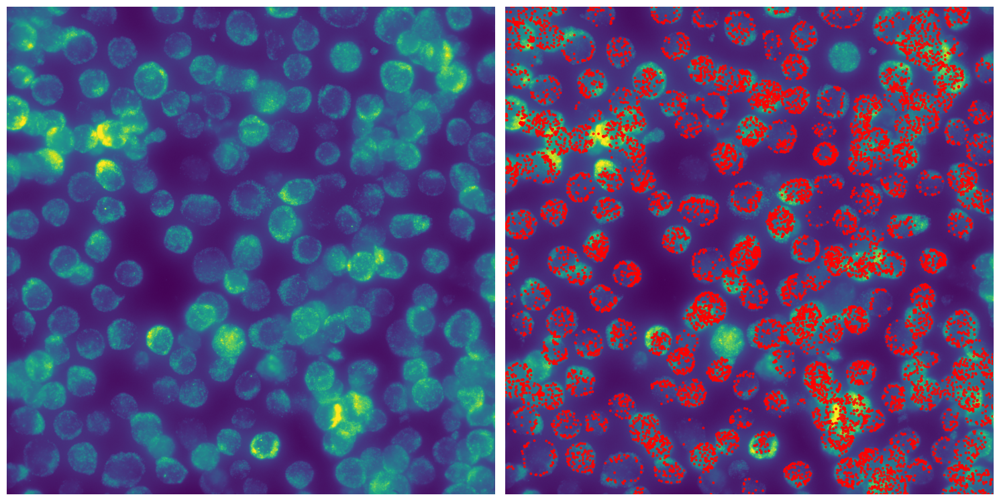

In [39]:
projection = stack.maximum_projection(dot_channel)
plot.plot_detection(projection, spots, contrast=True)

In [40]:
import plotly.graph_objects as go
import numpy as np
from PIL import Image
import io
import base64

# Normalize image
img_norm = np.clip(projection, np.percentile(projection, 1), np.percentile(projection, 99))
img_norm = ((img_norm - img_norm.min()) / (img_norm.max() - img_norm.min()) * 255).astype(np.uint8)

# Convert to PNG base64 string for plotly background
img_pil = Image.fromarray(img_norm)
buffer = io.BytesIO()
img_pil.save(buffer, format="PNG")
encoded_image = base64.b64encode(buffer.getvalue()).decode()

# Set up figure
fig = go.Figure()

# Add spots (x = col, y = row)
fig.add_trace(go.Scatter(
    x=spots[:, 2],
    y=spots[:, 1],
    mode='markers',
    marker=dict(size=4, color='red', symbol='circle-open', line=dict(width=0.5)),
    name='Spots'
))

# Set image background
fig.update_layout(
    images=[dict(
        source='data:image/png;base64,' + encoded_image,
        xref="x", yref="y",
        x=0, y=0,
        sizex=img_norm.shape[1], sizey=img_norm.shape[0],
        sizing="stretch",
        opacity=1,
        layer="below"
    )],
    yaxis=dict(scaleanchor="x", autorange='reversed'),
    xaxis=dict(showgrid=False),
    yaxis_showgrid=False,
    width=800,
    height=800,
    margin=dict(l=0, r=0, t=30, b=0),
    title=f"FOV 01 - {spots.shape[0]} Spots"
)

fig.show()

